# **Case Study : Ninjacart**

[*Ninjacart*](https://ninjacart.in/) is India's largest fresh produce supply chain company, connecting producers directly with the retailers.

- You are a Data Scientist at *Ninjacart*, you have curated a dataset consisting of some vegetables and other images at a vegetable market.
- You want to classify these images using computer vision. 

- We will explore how to preprocess, load, augment our raw data and train state-of-the-art model architectures on it and compare them to analyze the best model for our use-case.
<br>

<h3><b>How Ninjacart works</b><br>
<br><img src='https://drive.google.com/uc?id=1boHYwht03R1zj8lsBpK8o6OKRd1HjLDH' height=335> 

<br>

<br><h2> <b>Problem Overview</b><br>
<br><img src='https://drive.google.com/uc?id=1vDh8wK3aDfjQo3BVsVn57yVRQG6L0lfQ' height=400> 


# Importing required libraries
Importing the required libraries which we will be using throughout our training pipeline

In [ ]:
import os
import glob
import random
import pandas as pd
import seaborn as sns
import tensorflow as tf
import matplotlib.pyplot as plt

# Loading the Data - 10 Points
Downloading our Dataset from Google drive using `gdown` command

In [ ]:
!gdown https://drive.google.com/uc?id=1clZX-lV_MLxKHSyeyTheX5OCQtNCUcqT

Downloading...
From: https://drive.google.com/uc?id=1aUvpiQMF2LRiS0GxeldFIZL1mIGeSsLQ
To: /content/ninjacart_data.zip
100% 275M/275M [00:01<00:00, 176MB/s]


Unzipping our downloaded data 

In [ ]:
!unzip /content/ninjacart_data.zip

Archive:  /content/ninjacart_data.zip
   creating: ninjacart_data/test/
   creating: ninjacart_data/test/indian market/
  inflating: ninjacart_data/test/indian market/bhl.jpeg  
  inflating: ninjacart_data/test/indian market/bhv.jpeg  
  inflating: ninjacart_data/test/indian market/bn.jpeg  
  inflating: ninjacart_data/test/indian market/hjx.jpeg  
  inflating: ninjacart_data/test/indian market/igis.jpeg  
  inflating: ninjacart_data/test/indian market/in.jpeg  
  inflating: ninjacart_data/test/indian market/india-4898453__340.jpg  
  inflating: ninjacart_data/test/indian market/indianmarket10.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket12.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket13.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket14.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket15.jpeg  
  inflating: ninjacart_data/test/indian market/indianmarket18.jpeg  
  inflating: ninjacart_data/test/indian market/



<h3> Let's analyze what data we have curated ! 

> We can visualize from the data directory, the data is divided into train/test folders, 
<br>consisting of four subfolders containing images of :
 - Indian market
 - Onion
 - Potato
 - Tomato
 <br><br>
><h4>Directory structure of our Dataset<br>
><img src='https://drive.google.com/uc?id=18uxOob7hI6xAIcHlF26tn7ppG9-Y2KkY' width=230> 

## Visualizing our Images
<h3> Now let's plot some random images from our Dataset from each class ! 

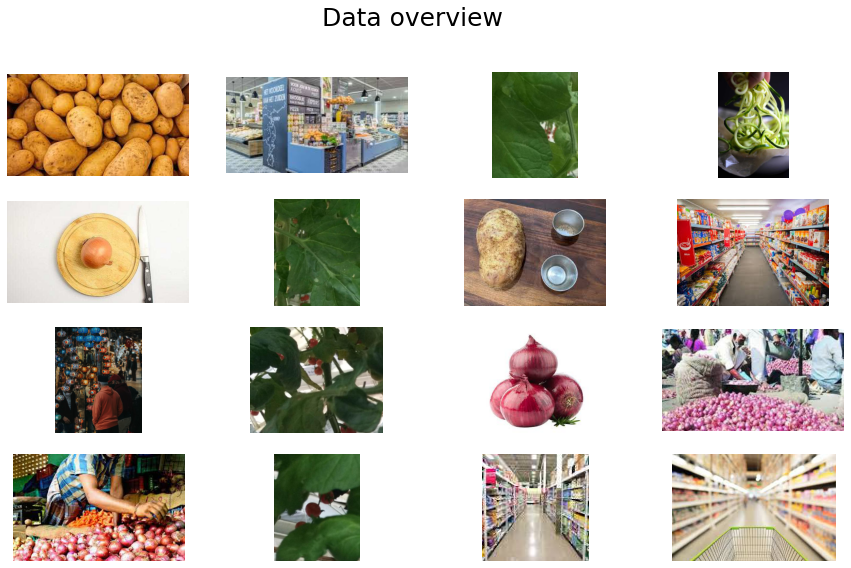

In [ ]:
train_folder = '/content/ninjacart_data/train'

images = []
for folder in os.listdir(train_folder):
  for image in os.listdir(train_folder + '/' + folder):
    images.append(os.path.join(train_folder, folder, image))

fig = plt.figure(1, figsize=(15, 9))
fig.suptitle('Data overview', fontsize=25)
plt.axis('off')
n = 0
for i in range(16):
  n += 1
  random_img = random.choice(images)
  imgs = tf.keras.utils.load_img(random_img)
  plt.subplot(4, 4, n)
  plt.axis('off')
  plt.imshow(imgs)

plt.show()

# Exploratory Data Analysis - 20 points
- We write a code snippet to fetch the paths of all images for every class in our train and test set in root folder, which we will use later to test our model on random samples.

- The image arrays and count for every class are stored in a dictionary to plot its distribution

In [ ]:
class_dirs = os.listdir("/content/ninjacart_data/train") # list all directories inside "train" folder
image_dict = {} # dict to store image array(key) for every class(value)
count_dict = {} # dict to store count of files(key) for every class(value)

# iterate over all class_dirs
for cls in class_dirs:
    # get list of all paths inside the subdirectory
    file_paths = glob.glob(f'/content/ninjacart_data/train/{cls}/*')
    # count number of files in each class and add it to count_dict
    count_dict[cls] = len(file_paths)
    # select random item from list of image paths
    image_path = random.choice(file_paths)
    # load image using keras utility function and save it in image_dict
    image_dict[cls] = tf.keras.utils.load_img(image_path)

<h4>Store image arrays and count for each class in test data :

In [ ]:
class_dirs_test = os.listdir("/content/ninjacart_data/test") # list all directories inside "test" folder
image_dict_test = {} # dict to store image array(key) for every class(value)
count_dict_test = {} # dict to store count of files(key) for every class(value)

# iterate over all class_dirs
for cls in class_dirs_test:
    # get list of all paths inside the subdirectory
    file_paths_test = glob.glob(f'/content/ninjacart_data/test/{cls}/*')
    # count number of files in each class and add it to count_dict
    count_dict_test[cls] = len(file_paths_test)
    # select random item from list of image paths
    image_path = random.choice(file_paths_test)
    # load image using keras utility function and save it in image_dict
    image_dict_test[cls] = tf.keras.utils.load_img(image_path)


## Image Dimensions Analysis: 5 points

<h4>Plot a Grid of training samples from each class to display their dimensions

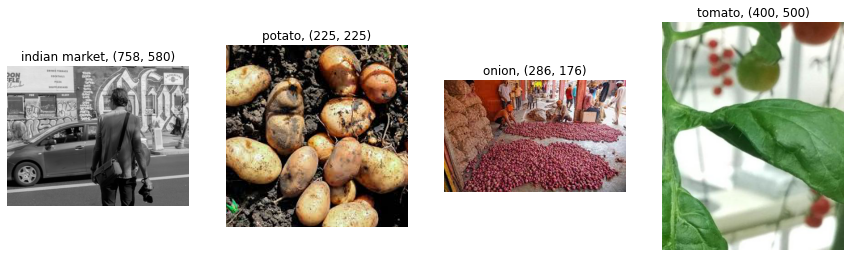

In [ ]:
# Visualize Random Sample from each class

plt.figure(figsize=(15, 7))
# iterate over dictionary items (class label, image array)
for i, (cls,img) in enumerate(image_dict.items()):    
    # create a subplot axis
    ax = plt.subplot(1, 4, i + 1)
    # plot each image
    plt.imshow(img)
    # set "class name" along with "image size" as title 
    plt.title(f'{cls}, {img.size}')
    plt.axis("off")

- Analyze how our Dataset consists of uneven sized images !
- We have some images of the market, which we will label as class 'noise'
- To feed this data into our models, we need to preprocess it 

## Class Distribution Analysis:- 5 points
- Let's visualize how many samples of each class we have and if there's any class imbalance or not
- Plotting our Class distributions using our image_dict and count_dict which stores the images for each class along with its count
- We also feed our count_dict to a Dataframe to print the count for each class in our training and test directories

Count of training samples per class:
            class  count
0         tomato    789
1         potato    898
2  indian market    599
3          onion    849 



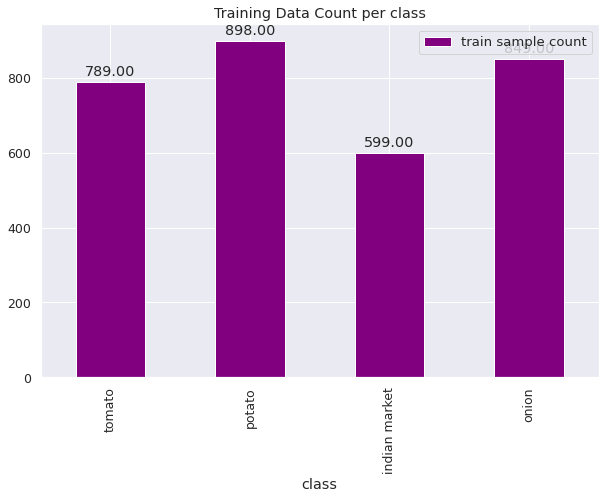

In [ ]:
# Let's now Plot the Data Distribution of Training Data across Classes
df_count_train = pd.DataFrame({
    "class": count_dict.keys(),     # keys of count_dict are class labels
    "count": count_dict.values(),   # value of count_dict contain counts of each class
})

print("Count of training samples per class:\n", df_count_train, "\n")

# draw a bar plot using pandas in-built plotting function
b = df_count_train.plot.bar(x='class', y='count', title="Training Data Count per class", label='train sample count', color='purple', figsize = (10, 6.5), fontsize=12.5)

# Annotate the bars in our plot with their values
for q in b.patches:
    b.annotate(f'{q.get_height():0.2f}', (q.get_x() + q.get_width() / 2., q.get_height()), 
               ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points') 
plt.show()

- From the above plot, we can quickly analyze that our Data is not evenly distributed, but is also not imbalanced, so we are good to go !

- But what about the minority class (*indian market*) ? 
    - We will use some {techniques} before feeding images to our network so that our model is generalized and is not biased for any class !

Count of testing samples per class:
            class  count
0         tomato    106
1         potato     81
2  indian market     81
3          onion     83 



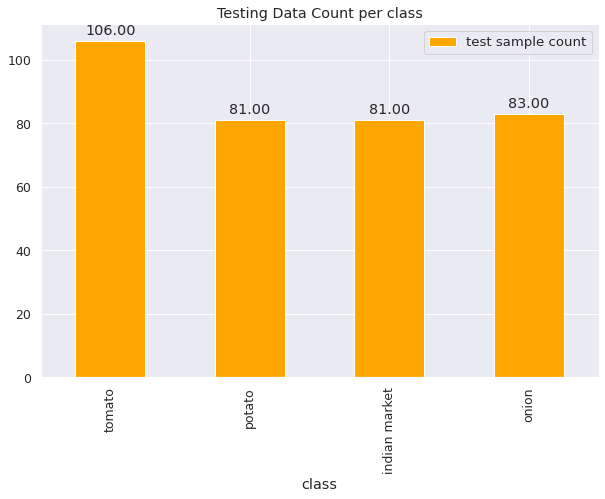

In [ ]:
# Let's now Plot the Data Distribution of Training Data across Classes
df_count_test = pd.DataFrame({
    "class": count_dict_test.keys(),     # keys of count_dict are class labels
    "count": count_dict_test.values(),   # value of count_dict contain counts of each class
})

print("Count of testing samples per class:\n", df_count_test, "\n")

# draw a bar plot using pandas in-built plotting function
a = df_count_test.plot.bar(x='class', y='count', title="Testing Data Count per class", color='orange', label='test sample count', figsize =(10, 6.5), fontsize=12.5) 
for p in a.patches:
    a.annotate(f'{p.get_height():0.2f}', (p.get_x() + p.get_width() / 2., p.get_height()), 
               ha = 'center', va = 'center', xytext = (0, 10), textcoords = 'offset points')
plt.show()

## Preparing the Dataset- 10 Points
Now that we have analyzed and Explored our Raw Data, now to feed our Data into our model, 
- Every image needs to be labelled according to its class and converted to a tensor.
- We will split our data into 3 sets : Train, Test and Validation

For this task, we will use `tf.keras.utils.image_dataset_from_directory`, which will :

- Create an **(image, label)** pair for every image
- Automatically label the images using one-hot encoding 
  - Eg : An image in the folder *indian market* will be labelled as **[1, 0, 0, 0]**
  - Since we have 4 classes, our classes will be one-hot encoded **alphabetically**, 
  - meaning our first class is indian market, fourth will be tomato.

- Batching (Grouping) images together according to *batch_size*
- Resize the Images to the shape ***(256, 256)***
- Seed the shuffling of our images, so that it shuffles in a 'fixed' way

  - which will be used to create our validation data

- Splitting 20% of our training data for validation
- Shuffling the data according to the `seed`

In [ ]:
train_dir = '/content/ninjacart_data/train'
test_dir = '/content/ninjacart_data/test'

In [ ]:
# Specifying the image size to resize all images
image_size = (256, 256)

In [ ]:
train_ds = tf.keras.utils.image_dataset_from_directory(directory = train_dir,
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = image_size,
                                                       seed = 2022,
                                                       validation_split = 0.2,
                                                       subset = "training",
                                                       shuffle=True)

Found 3135 files belonging to 4 classes.
Using 2508 files for training.


In [ ]:
test_ds = tf.keras.utils.image_dataset_from_directory(directory = test_dir,
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = image_size,
                                                       seed = 2022,
                                                      )

Found 351 files belonging to 4 classes.


Specifying our Validation data, which we took from our train_ds specifying `validation_split = 0.2` 

We take the last 20% data from our train_ds, we use the same seed as train_ds

In [ ]:
valid_ds = tf.keras.utils.image_dataset_from_directory(directory = train_dir,
                                                       label_mode = 'categorical',
                                                       batch_size = 32,
                                                       image_size = image_size,
                                                       seed = 2022,
                                                       validation_split = 0.2,
                                                       subset = "validation")

Found 3135 files belonging to 4 classes.
Using 627 files for validation.


Since `label_mode = 'categorical'` one-hot encodes the classes **alphabetically**, 
<br>*indian market* (which we consider noise) = class 1 and *tomato* = class 4

In [ ]:
# index           0        1        2         3
class_names = ['noise', 'onion', 'potato', 'tomato']

# <U>Creating Model architecture and training : 50 points

## Building custom CNN model- 10 Points

Let's build a baseline CNN Architecture with some Convolutional blocks which MaxPooling 


### Defining the model architecture

In [ ]:
model = tf.keras.Sequential([
            
tf.keras.layers.Rescaling(1./255),
tf.keras.layers.InputLayer(input_shape = [image_size[0], image_size[1], 3]),
    
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),
                                      
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),
                                      
tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
    
tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dense(4, activation = 'softmax') 
])

### Compiling the model


In [ ]:
model.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy', 'Precision', 'Recall'])

###  Model Training

- Implementing TensorBoard callback to plot our model's metrics later and store them in our log directory

In [ ]:
log_dir_1 = "logs/Custom_CNN_overfit"
tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_1, histogram_freq=1)

In [ ]:
history = model.fit(train_ds, epochs=20, validation_data=valid_ds, callbacks=[tensorboard_cb])

Epoch 1/20
79/79 [==============================] - 23s 139ms/step - loss: 1.3106 - accuracy: 0.3620 - precision: 1.0000 - recall: 0.0012 - val_loss: 1.1790 - val_accuracy: 0.4928 - val_precision: 1.0000 - val_recall: 0.0112
Epoch 2/20
79/79 [==============================] - 11s 127ms/step - loss: 1.0026 - accuracy: 0.5897 - precision: 0.7691 - recall: 0.2803 - val_loss: 0.8633 - val_accuracy: 0.6699 - val_precision: 0.8224 - val_recall: 0.4211
Epoch 3/20
79/79 [==============================] - 13s 152ms/step - loss: 0.7889 - accuracy: 0.7077 - precision: 0.8084 - recall: 0.5247 - val_loss: 0.7331 - val_accuracy: 0.7177 - val_precision: 0.8030 - val_recall: 0.5917
Epoch 4/20
79/79 [==============================] - 11s 127ms/step - loss: 0.7147 - accuracy: 0.7261 - precision: 0.8119 - recall: 0.6300 - val_loss: 0.6906 - val_accuracy: 0.7400 - val_precision: 0.8099 - val_recall: 0.6252
Epoch 5/20
79/79 [==============================] - 11s 125ms/step - loss: 0.6526 - accuracy: 0.7600

## Plotting our Model's performance - 5points

In [ ]:
def plot_acc_loss(model_history, n_epochs):

  fig, axes = plt.subplots(nrows=1, ncols=2,figsize=(15,5))
  ax = axes.ravel()

  #accuracy graph
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['accuracy']], label='Train', color='b')
  ax[0].plot(range(0, n_epochs), [acc * 100 for acc in model_history.history['val_accuracy']], label='Val', color='r')
  ax[0].set_title('Accuracy vs. epoch', fontsize=15)
  ax[0].set_ylabel('Accuracy', fontsize=15)
  ax[0].set_xlabel('epoch', fontsize=15)
  ax[0].legend()

  #loss graph
  ax[1].plot(range(0, n_epochs), model_history.history['loss'], label='Train', color='b')
  ax[1].plot(range(0, n_epochs), model_history.history['val_loss'], label='Val', color='r')
  ax[1].set_title('Loss vs. epoch', fontsize=15)
  ax[1].set_ylabel('Loss', fontsize=15)
  ax[1].set_xlabel('epoch', fontsize=15)
  ax[1].legend()

  #display the graph
  plt.show()

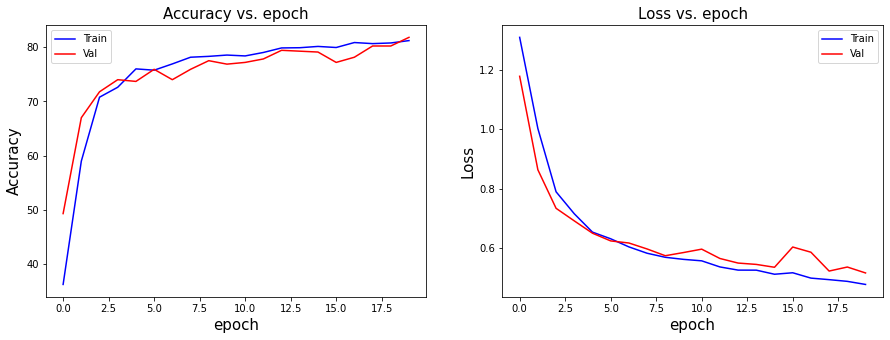

In [ ]:
plot_acc_loss(history, n_epochs = 20)

In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling (Rescaling)       (None, 256, 256, 3)       0         
                                                                 
 input_1 (InputLayer)        multiple                  0         
                                                                 
 conv2d (Conv2D)             (None, 256, 256, 32)      896       
                                                                 
 conv2d_1 (Conv2D)           (None, 256, 256, 32)      9248      
                                                                 
 max_pooling2d (MaxPooling2D  (None, 128, 128, 32)     0         
 )                                                               
                                                                 
 conv2d_2 (Conv2D)           (None, 128, 128, 64)      18496     
                                                        

## Testing the model

We list all the files in our test directory and append their complete paths to a list *test_images* which we will use to test our model by predicting on on random unseen data 



In [ ]:
test_images = []

for folder in os.listdir(test_dir):
  for image in os.listdir(test_dir + '/' + folder):
    test_images.append(os.path.join(test_dir, folder, image))

### Random Sample testing

To test our model on a random sample :
- Read a random image from test_images list containing paths of all test images
- Resize an image to (256, 256)
- Add an extra dimension to our image's first dimension index
- Predict on the image using `model.predict()`

In [ ]:
def grid_test_model(model_name):

  fig = plt.figure(1, figsize=(17, 11))
  plt.axis('off')
  n = 0
  for i in range(8):
    n += 1

    img_0 = tf.keras.utils.load_img(random.choice(test_images))
    img_0 = tf.keras.utils.img_to_array(img_0)
    img_0 = tf.image.resize(img_0, (256, 256))
    img_1 = tf.expand_dims(img_0, axis = 0)

    pred = model_name.predict(img_1)
    predicted_label = tf.argmax(pred, 1).numpy().item()
    
    for item in pred :
      item = tf.round((item*100))

    plt.subplot(2, 4, n)
    plt.axis('off')
    plt.title(f'prediction : {class_names[predicted_label]}\n\n' 
              f'{item[0]} % {class_names[0]}\n' 
              f'{item[1]} % {class_names[1]}\n' 
              f'{item[2]} % {class_names[2]}\n' 
              f'{item[3]} % {class_names[3]}\n') 
    plt.imshow(img_0/255)
  plt.show()

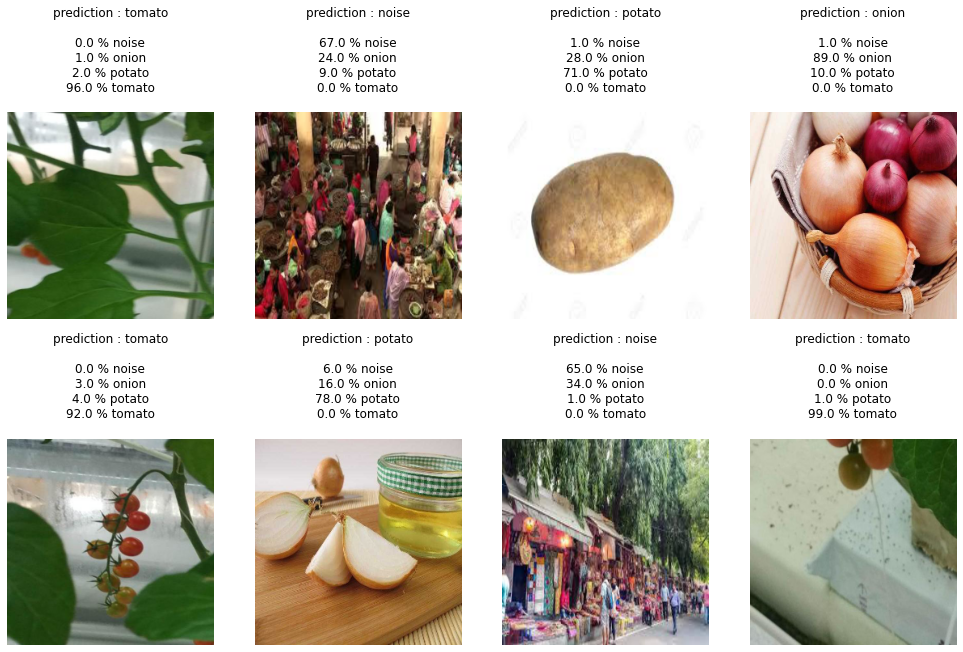

In [ ]:
grid_test_model(model)

By observing the above plot, we can analyze that our Model is **not too sure** of the correct class.... 
<br>We have to revamp our model to increase its confidence

Also, notice how our images are evenly sized ( 256x256 ) now ! 

### Evaluating accuracy on each class
 First we specify paths of each of our test classes 

- We define a function `classwise_accuracy` which calculates accuracy for each class by taking in class path and model, 
- We append all the file paths for the input class in a list
-  from which we predict on all images and check if the label and predicted label are equal,<br>
according to which we calculate the accuracy of our model on the input class

In [ ]:
noise_path = '/content/ninjacart_data/test/indian market'
onion_path = '/content/ninjacart_data/test/onion'
potato_path = '/content/ninjacart_data/test/potato'
tomato_path = '/content/ninjacart_data/test/tomato'

In [ ]:
def classwise_accuracy(class_path, class_name, model_name) :
    paths = []
    for i in os.listdir(class_path):
        paths.append(class_path + "/" + str(i))

    correct = 0
    total = 0

    for i in range(len(paths)):
        total+= 1

        img = tf.keras.utils.load_img(paths[i])
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img)
        if tf.argmax(pred[0]) == class_names.index(f"{class_name}"):
            correct+= 1   

    print(f"Accuracy for class {class_name} is {round((correct/total)*100, 2)}% consisting of {len(paths)} images")

In [ ]:
classwise_accuracy(noise_path, 'noise', model)
classwise_accuracy(onion_path, 'onion', model)
classwise_accuracy(potato_path, 'potato', model)
classwise_accuracy(tomato_path, 'tomato', model)

Accuracy for class noise is 69.14% consisting of 81 images
Accuracy for class onion is 63.86% consisting of 83 images
Accuracy for class potato is 72.84% consisting of 81 images
Accuracy for class tomato is 96.23% consisting of 106 images


## Plotting the Confusion Matrix : - 5points

- We define four empty lists, in which we will store predicted classes by our model for a particular class images
- We define a function `conf_mat` which takes in the path of the class, empty list and the model 
- The function reads an image from the given path, resizes it and converts to RGB
- Add an extra dimension at first index of the image and predict on the image with the input model
- Check which class the model has predicted the image belongs to and 
- append +1 to the index of the class 
  - Eg : If the model predicts that the image belongs to class tomato 
  - we will append +1 at the fourth index(3) of our list like [0, 0, 0, 1]
- After calculating the value in our 4 lists for each class, 
<br>we combine them, which gives us the confusion matrix of our model and plot them with seaborn

In [ ]:
noise, tomato, potato, onion = 0, 0, 0, 0

l1 = []
l2 = []
l3 = []
l4 = []

In [ ]:
sns.set(rc={'figure.figsize':(11.7, 8.27)})
sns.set(font_scale=1.2)

In [ ]:
def conf_mat(class_path, pred_list, model_name) :
    noise, tomato, potato, onion = 0, 0, 0, 0
    for i in os.listdir(class_path):

        img = tf.keras.utils.load_img(class_path + "/" + str(i))
        img = tf.keras.utils.img_to_array(img)
        img = tf.image.resize(img, (256, 256))
        img = tf.expand_dims(img, axis = 0)

        pred = model_name.predict(img)
        predicted = tf.argmax(pred, 1).numpy().item()

        if predicted == 0:
            noise+= 1
        elif predicted == 1:
            onion+= 1
        elif predicted == 2:
            potato+= 1
        else:
            tomato+= 1  


    for item in noise, onion, potato, tomato :
        pred_list.append(item)

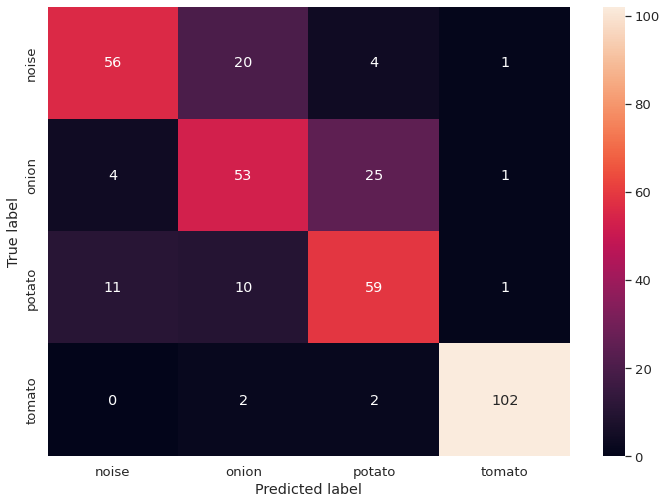

In [ ]:
conf_mat(noise_path, l1, model)
conf_mat(onion_path, l2, model)
conf_mat(potato_path, l3, model)
conf_mat(tomato_path, l4, model)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = model.evaluate(test_ds)
dict(zip(model.metrics_names, result))

11/11 [==============================] - 2s 72ms/step - loss: 0.5301 - accuracy: 0.7635 - precision: 0.8019 - recall: 0.7265


{'loss': 0.5300732254981995,
 'accuracy': 0.7635327577590942,
 'precision': 0.801886796951294,
 'recall': 0.7264957427978516}

- We can observe that our basline CNN model has a categorical cross entropy loss of ~ 0.5 
- which indicates overfitting, now let's work on how we can improve our model's performance by using some certain techniques !

## Model Tuning - 10 points



### Augmenting our Data
- Data Augmentation introduces our model to different aspects and visualizaitons of class images, therefore increasing model generalization
- We apply 3 types of augmentation on our training dataset
  - `RandomFlip` : randomly flips images horizontally and vertically during training

  - `RandomRotation` : randomly rotates images during training by a factor 
  
  - `RandomTranslation` : randomly translates images during training by a shift factor

In [ ]:
augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip("horizontal_and_vertical"),
    tf.keras.layers.RandomRotation(0.2),
    tf.keras.layers.RandomTranslation(height_factor = 0.2, width_factor=0.2)
])

aug_ds = train_ds 

for image, label in aug_ds :
  image = augmentation(image)

### Adding BatchNormalization and Dropout
We add `Dropout()` and `BatchNormalization()` to our model architecture, which will help in improving its generalization
<br><br>
How do they help ?
- `Dropout()` : Drops out random neurons while training which forces the model to focus on every feature for prediction

- `BatchNormalization()` : Normalizes the inputs from previous layer for every mini-batch before sending it to the next layer.
<br>Help in mantaining the distribution of our data by making it a normal distribution (mean = 0, std. = 1)

In [ ]:
model_revamp = tf.keras.Sequential([
            
tf.keras.layers.Rescaling(1./255),
tf.keras.layers.InputLayer(input_shape = [image_size[0], image_size[1], 3]),
    
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 32, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),
 
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.Conv2D(filters = 64, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),
tf.keras.layers.MaxPool2D(pool_size = (2,2)),
                                      
tf.keras.layers.Conv2D(filters = 128, kernel_size = (3,3), padding = 'Same', activation = 'relu'),
tf.keras.layers.BatchNormalization(),   
tf.keras.layers.GlobalAveragePooling2D(),
tf.keras.layers.Dropout(rate = 0.2),

tf.keras.layers.Dense(4, activation = 'softmax')
])

In [ ]:
model_revamp.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
                    loss = tf.keras.losses.CategoricalCrossentropy(),
                    metrics = ['accuracy', 'Precision', 'Recall'])

## Implementing Callbacks- 10 points

We specify some callbacks to improve our model training process :
- `TensorBoard` : Enable visualizations for TensorBoard for our model's metrics, which we will plot later

- `ModelCheckpoint` : Callback to save the model weights at a given frequency,
<br> saves the best model having the lowest 'val_loss' by default

- `EarlyStopping` : Stop training when a monitored metric (val_loss) has stopped improving,
<br>after waiting for 5 epochs, specified by `patience=5`

In [ ]:
log_dir_2 = "logs/Custom_CNN_revamp"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir = log_dir_2, histogram_freq = 1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("CNN_best.h5", save_best_only = True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights = True
)

## Training our Tuned model

In [ ]:
history_0 = model_revamp.fit(
train_ds, 
epochs=20, 
validation_data = valid_ds, 
callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
79/79 [==============================] - 12s 135ms/step - loss: 0.7432 - accuracy: 0.7026 - precision: 0.8020 - recall: 0.5654 - val_loss: 1.3875 - val_accuracy: 0.2297 - val_precision: 0.0000e+00 - val_recall: 0.0000e+00
Epoch 2/20
79/79 [==============================] - 11s 131ms/step - loss: 0.5337 - accuracy: 0.7927 - precision: 0.8483 - recall: 0.7360 - val_loss: 1.4929 - val_accuracy: 0.2297 - val_precision: 0.3380 - val_recall: 0.2297
Epoch 3/20
79/79 [==============================] - 11s 129ms/step - loss: 0.4802 - accuracy: 0.8206 - precision: 0.8607 - recall: 0.7711 - val_loss: 1.5693 - val_accuracy: 0.2297 - val_precision: 0.2466 - val_recall: 0.2297
Epoch 4/20
79/79 [==============================] - 11s 130ms/step - loss: 0.4353 - accuracy: 0.8345 - precision: 0.8726 - recall: 0.7923 - val_loss: 1.5139 - val_accuracy: 0.2376 - val_precision: 0.2812 - val_recall: 0.2297
Epoch 5/20
79/79 [==============================] - 11s 129ms/step - loss: 0.4125 - accuracy

In [ ]:
result = model_revamp.evaluate(test_ds)
dict(zip(model_revamp.metrics_names, result))

11/11 [==============================] - 1s 38ms/step - loss: 0.4126 - accuracy: 0.8462 - precision: 0.8958 - recall: 0.7835


{'loss': 0.4126041829586029,
 'accuracy': 0.8461538553237915,
 'precision': 0.895765483379364,
 'recall': 0.7834757566452026}

<h3> We observe an <b>accuracy jump of ~10 %</b> by just :

- Applying augmentation to our data
- Adding Dropout and BatchNormalization
- Implementing callbacks during training

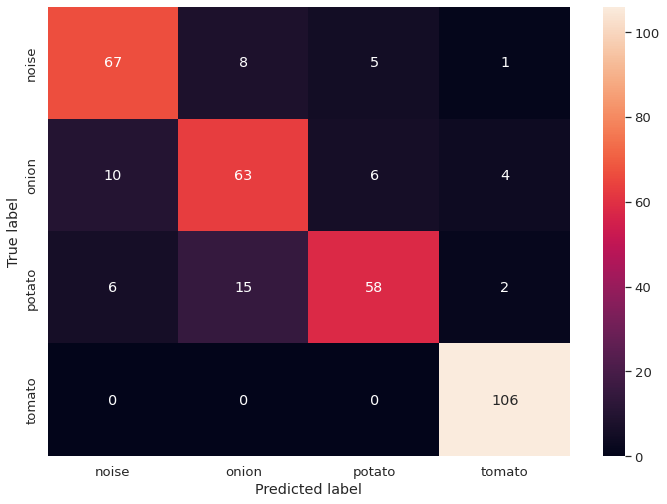

In [ ]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_revamp)
conf_mat(onion_path, l2, model_revamp)
conf_mat(potato_path, l3, model_revamp)
conf_mat(tomato_path, l4, model_revamp)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels = class_names, yticklabels = class_names, annot = True, fmt = 'g')
ax.set(xlabel = 'Predicted label', ylabel = 'True label')
plt.show()

<h4>In the Confusion matrix plotted above, we can observe that :

- Our model can easily differentiate between all classes with minimal error
- Potato and onion are the most confusing classes for our model
- Tomato can be easily differentiated with the smallest error

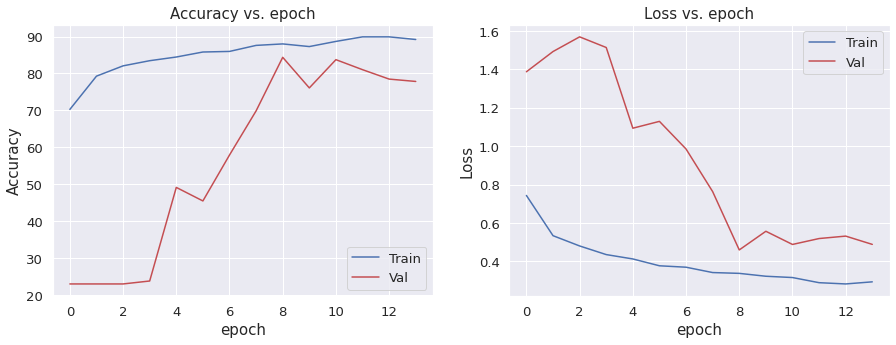

In [ ]:
plot_acc_loss(history_0, n_epochs = 14)

In [ ]:
classwise_accuracy(noise_path, 'noise', model_revamp)
classwise_accuracy(onion_path, 'onion', model_revamp)
classwise_accuracy(potato_path, 'potato', model_revamp)
classwise_accuracy(tomato_path, 'tomato', model_revamp)

Accuracy for class noise is 82.72% consisting of 81 images
Accuracy for class onion is 75.9% consisting of 83 images
Accuracy for class potato is 71.6% consisting of 81 images
Accuracy for class tomato is 100.0% consisting of 106 images


## Applying Transfer Learning:- 10 points

- Now that we solved overfitting problem of our Baseline model, 
- Let's also explore and implement some state-of-the-art model architectures which can give us even higher precision and accuracy.

- We explored some of the available pretrained model which we can finetune to our data in [Keras docs](https://keras.io/api/applications/),
<br> We will train 3 of the most efficient and accurate pretrained models on the ImageNet dataset

The Models we will use :
- VGG-19
- ResNet 
- MobileNet 

# **VGG-19**

VGG-19 performance on ImageNet Dataset, let's find out how it performs on our Data after finetuning !

<br>

| Model | Size (MB) | Top-1 Acc | Top-5 Acc | Parameters | Depth | Time(ms) on CPU| Time (ms) on GPU| 
| --- | --- | --- | --- | --- | --- |--- | --- |
| VGG19 | 549 | 71.3% | 90.0% | 143.7M | 19 | 84.8 | 4.4 | 


In [ ]:
# load base model
base_model_3 = tf.keras.applications.vgg19.VGG19(input_shape=(256, 256, 3), include_top = False)

# base_model_3.trainable  = False
# for layers in base_model_3.layers[:10]:
#   layers.trainable = False 

80150528/80134624 [==============================] - 1s 0us/step


In [ ]:
# append classification layer
model_3 = base_model_3.output

model_3 = tf.keras.Sequential([
#     tf.keras.layers.Lambda(
# lambda data: tf.keras.applications.vgg19.preprocess_input( tf.cast(data, tf.float32)),
#           input_shape=[IMG_HEIGHT, IMG_WIDTH, 3]),
#         pretrained_model,
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255),
            tf.keras.layers.InputLayer(input_shape=[image_size[0], image_size[1], 3]),
            base_model_3,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [ ]:
model_3.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy', 'Precision', 'Recall'])

In [ ]:
log_dir_5 = "logs/VGG19"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_5, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("VGG19", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [ ]:
history_3 = model_3.fit(aug_ds, validation_data = valid_ds, epochs = 20, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
79/79 [==============================] - 32s 359ms/step - loss: 0.6214 - accuracy: 0.7301 - precision: 0.7987 - recall: 0.6423 - val_loss: 0.3240 - val_accuracy: 0.8947 - val_precision: 0.9023 - val_recall: 0.8836
Epoch 2/20
79/79 [==============================] - 29s 357ms/step - loss: 0.2824 - accuracy: 0.8975 - precision: 0.9126 - recall: 0.8828 - val_loss: 0.2382 - val_accuracy: 0.9346 - val_precision: 0.9403 - val_recall: 0.9298
Epoch 3/20
79/79 [==============================] - 23s 283ms/step - loss: 0.2257 - accuracy: 0.9151 - precision: 0.9236 - recall: 0.9067 - val_loss: 0.2651 - val_accuracy: 0.9203 - val_precision: 0.9216 - val_recall: 0.9187
Epoch 4/20
79/79 [==============================] - 23s 284ms/step - loss: 0.1768 - accuracy: 0.9406 - precision: 0.9447 - recall: 0.9326 - val_loss: 0.3444 - val_accuracy: 0.9075 - val_precision: 0.9103 - val_recall: 0.9059
Epoch 5/20
79/79 [==============================] - 27s 336ms/step - loss: 0.1153 - accuracy: 0.9589

## Evaluating VGG-19

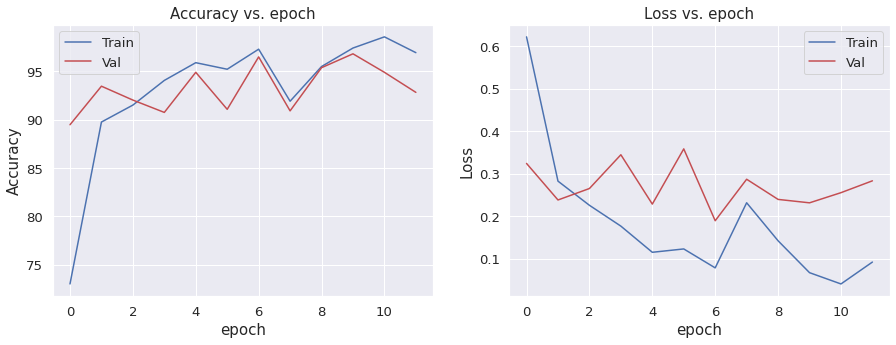

In [ ]:
plot_acc_loss(history_3, n_epochs = 12)

In [ ]:
classwise_accuracy(noise_path, 'noise', model_3)
classwise_accuracy(onion_path, 'onion', model_3)
classwise_accuracy(potato_path, 'potato', model_3)
classwise_accuracy(tomato_path, 'tomato', model_3)

Accuracy for class noise is 83.95% consisting of 81 images
Accuracy for class onion is 100.0% consisting of 83 images
Accuracy for class potato is 82.72% consisting of 81 images
Accuracy for class tomato is 100.0% consisting of 106 images


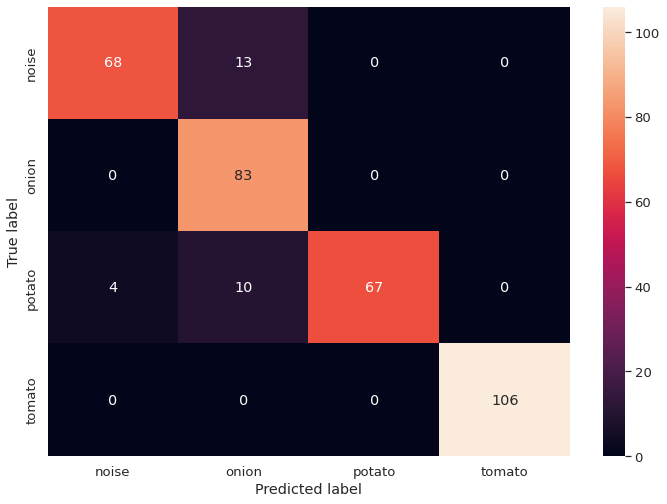

In [ ]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_3)
conf_mat(onion_path, l2, model_3)
conf_mat(potato_path, l3, model_3)
conf_mat(tomato_path, l4, model_3)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = model_3.evaluate(test_ds)
dict(zip(model_3.metrics_names, result))

11/11 [==============================] - 3s 173ms/step - loss: 0.3786 - accuracy: 0.9174 - precision: 0.9253 - recall: 0.9174


{'loss': 0.3786006271839142,
 'accuracy': 0.9173789024353027,
 'precision': 0.9252873659133911,
 'recall': 0.9173789024353027}

# **ResNet Model**

ResNet performance on ImageNet Dataset, let's find out how it performs on our Data !

<br>

| Model | Size (MB) | Top-1 Acc | Top-5 Acc | Parameters | Depth | Time(ms) on CPU| Time (ms) on GPU| 
| --- | --- | --- | --- | --- | --- |--- | --- |
| ResNet50 | 98 | 74.9% | 92.1% | 25.6M | 107 | 58.2 | 4.6 | 


In [ ]:
# load base model
base_model_1 = tf.keras.applications.resnet50.ResNet50(input_shape=(256, 256, 3), include_top = False)

94781440/94765736 [==============================] - 0s 0us/step


In [ ]:
# append classification layer
model_1 = base_model_1.output

model_1 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255),
            tf.keras.layers.InputLayer(input_shape=[image_size[0], image_size[1], 3]),
            base_model_1,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [ ]:
model_1.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy', 'Precision', 'Recall'])

In [ ]:
log_dir_3 = "logs/ResNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_3, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("ResNet.h5", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [ ]:
history_1 = model_1.fit(aug_ds, validation_data = valid_ds, epochs = 20, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
79/79 [==============================] - 29s 272ms/step - loss: 0.1879 - accuracy: 0.9294 - precision: 0.9489 - recall: 0.9179 - val_loss: 5.9403 - val_accuracy: 0.2121 - val_precision: 0.2121 - val_recall: 0.2121
Epoch 2/20
79/79 [==============================] - 20s 247ms/step - loss: 0.0303 - accuracy: 0.9908 - precision: 0.9916 - recall: 0.9908 - val_loss: 1.4681 - val_accuracy: 0.2727 - val_precision: 0.3050 - val_recall: 0.0973
Epoch 3/20
79/79 [==============================] - 19s 232ms/step - loss: 0.0212 - accuracy: 0.9924 - precision: 0.9924 - recall: 0.9916 - val_loss: 2.1005 - val_accuracy: 0.3046 - val_precision: 0.2581 - val_recall: 0.1770
Epoch 4/20
79/79 [==============================] - 20s 245ms/step - loss: 0.0078 - accuracy: 0.9980 - precision: 0.9980 - recall: 0.9980 - val_loss: 1.8315 - val_accuracy: 0.2217 - val_precision: 0.1608 - val_recall: 0.0797
Epoch 5/20
79/79 [==============================] - 19s 233ms/step - loss: 0.0103 - accuracy: 0.9964

## Evaluating ResNet

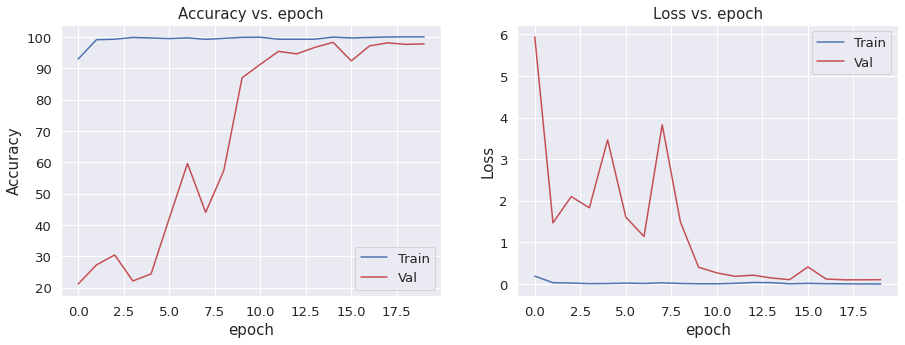

In [ ]:
plot_acc_loss(history_1, n_epochs = 20)

In [ ]:
classwise_accuracy(noise_path, 'noise', model_1)
classwise_accuracy(onion_path, 'onion', model_1)
classwise_accuracy(potato_path, 'potato', model_1)
classwise_accuracy(tomato_path, 'tomato', model_1)

Accuracy for class noise is 91.36% consisting of 81 images
Accuracy for class onion is 98.8% consisting of 83 images
Accuracy for class potato is 86.42% consisting of 81 images
Accuracy for class tomato is 100.0% consisting of 106 images


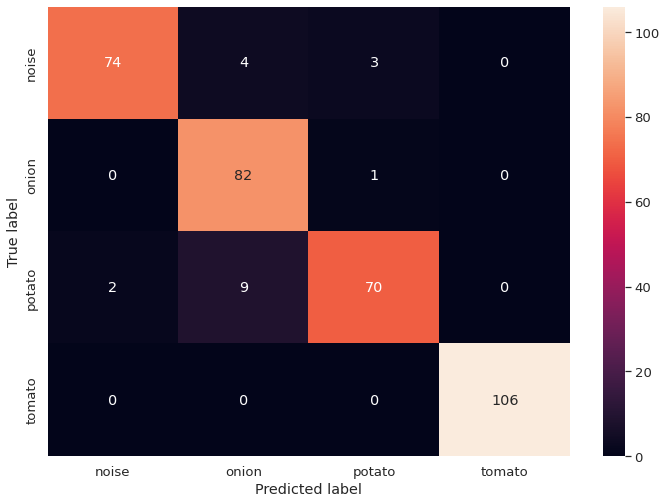

In [ ]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_1)
conf_mat(onion_path, l2, model_1)
conf_mat(potato_path, l3, model_1)
conf_mat(tomato_path, l4, model_1)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = model_1.evaluate(test_ds)
dict(zip(model_1.metrics_names, result))

11/11 [==============================] - 2s 97ms/step - loss: 0.2688 - accuracy: 0.9402 - precision: 0.9398 - recall: 0.9345


{'loss': 0.268846333026886,
 'accuracy': 0.94017094373703,
 'precision': 0.939828097820282,
 'recall': 0.934472918510437}

We achieved a test accuracy of **94%** on our finetuned ResNet Model, let's finetune a smaller sized model to deploy on our Mobile App !

# **MobileNet Model**

MobileNet performance on ImageNet Dataset, let's find out how it performs on our Data ! 
<br><br>

| Model | Size (MB) | Top-1 Acc | Top-5 Acc | Parameters | Depth | Time(ms) on CPU| Time (ms) on GPU| 
| --- | --- | --- | --- | --- | --- |--- | --- |
| MobileNet | 16 | 70.4% | 89.5% | 4.3M | 55 | 22.6 | 3.4 | 

In [ ]:
# load base model
base_model_2 = tf.keras.applications.mobilenet.MobileNet(input_shape=(256, 256, 3), include_top = False)

17235968/17225924 [==============================] - 0s 0us/step


In [ ]:
# append classification layer
model_2 = base_model_2.output

model_2 = tf.keras.Sequential([
            #Normalizing 0-255 into 0 to 1
            tf.keras.layers.Rescaling(1./255),
            tf.keras.layers.InputLayer(input_shape=[image_size[0], image_size[1], 3]),
            base_model_2,
            tf.keras.layers.GlobalAveragePooling2D(),
            tf.keras.layers.Dropout(rate = 0.1),
            tf.keras.layers.Dense(4, activation = 'softmax')
        ])

In [ ]:
log_dir_4 = "logs/MobileNet"

tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir=log_dir_4, histogram_freq=1)

checkpoint_cb = tf.keras.callbacks.ModelCheckpoint("MobileNet.h5", save_best_only=True)

early_stopping_cb = tf.keras.callbacks.EarlyStopping(
    monitor = 'val_loss', patience = 5, restore_best_weights=True
)

In [ ]:
model_2.compile(optimizer = tf.keras.optimizers.Adam(learning_rate = 1e-4),
              loss = tf.keras.losses.CategoricalCrossentropy(),
              metrics = ['accuracy', 'Precision', 'Recall'])

In [ ]:
history_2 = model_2.fit(aug_ds, validation_data = valid_ds, epochs = 20, callbacks=[tensorboard_cb, checkpoint_cb, early_stopping_cb])

Epoch 1/20
79/79 [==============================] - 21s 214ms/step - loss: 0.2832 - accuracy: 0.8995 - precision: 0.9226 - recall: 0.8792 - val_loss: 0.1627 - val_accuracy: 0.9410 - val_precision: 0.9467 - val_recall: 0.9346
Epoch 2/20
79/79 [==============================] - 16s 196ms/step - loss: 0.0359 - accuracy: 0.9900 - precision: 0.9908 - recall: 0.9896 - val_loss: 0.1013 - val_accuracy: 0.9617 - val_precision: 0.9632 - val_recall: 0.9601
Epoch 3/20
79/79 [==============================] - 16s 195ms/step - loss: 0.0205 - accuracy: 0.9964 - precision: 0.9964 - recall: 0.9952 - val_loss: 0.0896 - val_accuracy: 0.9745 - val_precision: 0.9745 - val_recall: 0.9745
Epoch 4/20
79/79 [==============================] - 16s 195ms/step - loss: 0.0158 - accuracy: 0.9964 - precision: 0.9964 - recall: 0.9952 - val_loss: 0.0725 - val_accuracy: 0.9809 - val_precision: 0.9809 - val_recall: 0.9809
Epoch 5/20
79/79 [==============================] - 16s 195ms/step - loss: 0.0067 - accuracy: 0.9992

In [ ]:
model_2.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_5 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 input_9 (InputLayer)        multiple                  0         
                                                                 
 mobilenet_1.00_224 (Functio  (None, 8, 8, 1024)       3228864   
 nal)                                                            
                                                                 
 global_average_pooling2d_5   (None, 1024)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_4 (Dropout)         (None, 1024)              0         
                                                                 
 dense_5 (Dense)             (None, 4)                

## Evaluating MobileNet

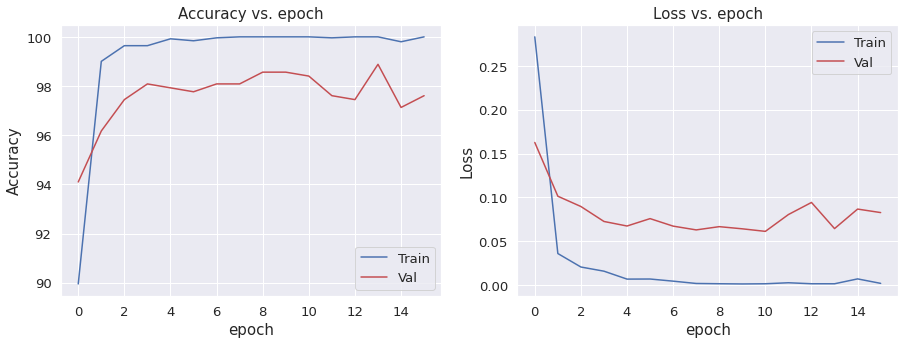

In [ ]:
plot_acc_loss(history_2, n_epochs = 16)

In [ ]:
classwise_accuracy(noise_path, 'noise', model_2)
classwise_accuracy(onion_path, 'onion', model_2)
classwise_accuracy(potato_path, 'potato', model_2)
classwise_accuracy(tomato_path, 'tomato', model_2)

Accuracy for class noise is 77.78% consisting of 81 images
Accuracy for class onion is 98.8% consisting of 83 images
Accuracy for class potato is 81.48% consisting of 81 images
Accuracy for class tomato is 100.0% consisting of 106 images


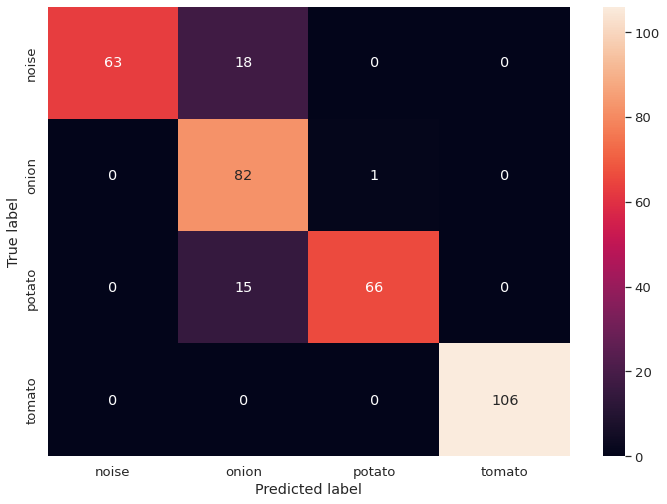

In [ ]:
l1 = []
l2 = []
l3 = []
l4 = []

conf_mat(noise_path, l1, model_2)
conf_mat(onion_path, l2, model_2)
conf_mat(potato_path, l3, model_2)
conf_mat(tomato_path, l4, model_2)

ax = sns.heatmap([l1, l2, l3, l4], xticklabels=class_names, yticklabels=class_names, annot=True, fmt='g')
ax.set(xlabel='Predicted label', ylabel='True label')
plt.show()

In [ ]:
result = model_2.evaluate(test_ds)
dict(zip(model_2.metrics_names, result))

11/11 [==============================] - 1s 58ms/step - loss: 0.4203 - accuracy: 0.9003 - precision: 0.9003 - recall: 0.9003


{'loss': 0.4203057289123535,
 'accuracy': 0.9002848863601685,
 'precision': 0.9002848863601685,
 'recall': 0.9002848863601685}

#<U>Models Comparison - 20 POINTS

##Summary of Trained models:


| Model | Test Acc| Train Acc
| --- | --- | ---|
| Custom CNN | 76% | 81% |
| CNN Revamp |  84%| 89% |
| VGG19 | 91% | 98% |
| ResNet50 | 94% | 99% | 
| MobileNet | 90% | 100% | 

<br>

- After training all of our Models, we found Resnet50 to be the most accurate model on our Dataset.

- Let's visualize all of our models via tensorboard from the logs we created during training 

- We observed that Resnet50 gave us the highest test accuracy and our baseline CNN gave us the lowest accuracy

In [ ]:
%load_ext tensorboard
%tensorboard --logdir /content/logs

<IPython.core.display.Javascript object>

# **Testing our best model (ResNet)** 

ResNet achieved the highest accuracy of **94%** among all the models we trained

Let's test our Finetuned ResNet to predict on some random unseen data to visualize how accurate it is !


In [ ]:
model_1.summary()

Model: "sequential_5"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 rescaling_4 (Rescaling)     (None, 256, 256, 3)       0         
                                                                 
 input_7 (InputLayer)        multiple                  0         
                                                                 
 resnet50 (Functional)       (None, 8, 8, 2048)        23587712  
                                                                 
 global_average_pooling2d_4   (None, 2048)             0         
 (GlobalAveragePooling2D)                                        
                                                                 
 dropout_3 (Dropout)         (None, 2048)              0         
                                                                 
 dense_4 (Dense)             (None, 4)                 8196      
                                                      

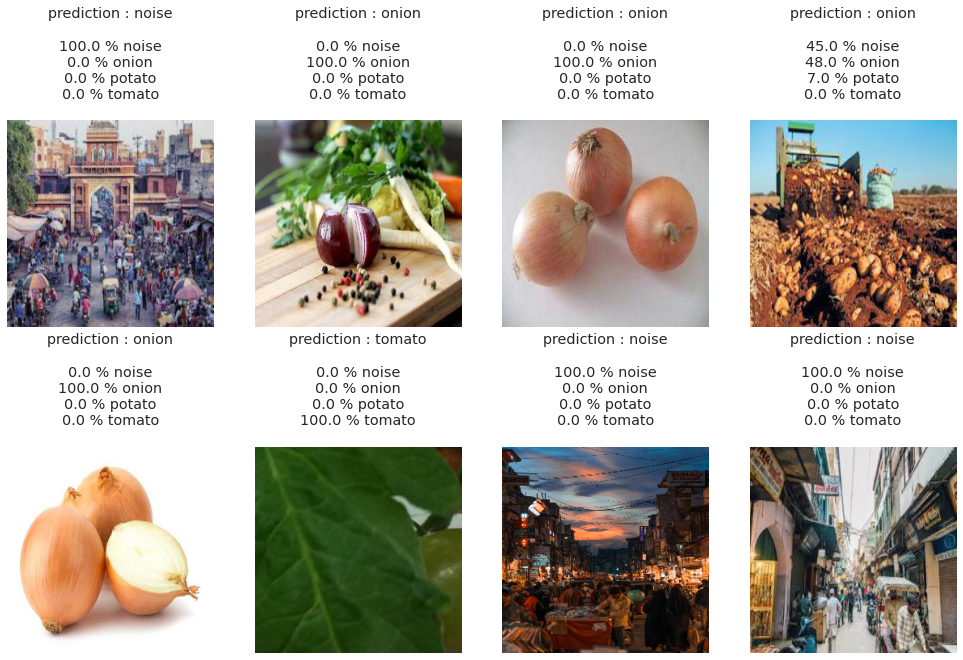

In [ ]:
grid_test_model(model_1)

We see that our Model is **nearly 100%** sure of the correct class in every image we plotted above, 
<br>indicating a very good choice for our classfication task.

In [ ]:
result = model_1.evaluate(test_ds)
dict(zip(model_1.metrics_names, result))

11/11 [==============================] - 2s 99ms/step - loss: 0.2688 - accuracy: 0.9402 - precision: 0.9398 - recall: 0.9345


{'loss': 0.26884639263153076,
 'accuracy': 0.94017094373703,
 'precision': 0.939828097820282,
 'recall': 0.934472918510437}